# U-Net 을 이용한 Puzzle 풀기

# `1` 기초

![image.png](colm.png)

[그림]

위의 그림처럼 4x4 의 이미지 격자형태가 뒤섞인 퍼즐 이미지를 원래의 그림에 맞추는 것이 목적인 대회입니다. 

### 시사점
1. 퍼즐의 순서를 맞 추는 AI 모델은 이미지 특징과 형태를 잘 파악하여 객체 탐지와 물체 분류 모델에 응용이 가능합니다.
2. 퍼즐 이미지 데이터는 원본 이미지만 있으면 쉽게 제작이 가능하며 labeling 도 자동적으로 수행가능하여 AI 모델 성능을 쉽게 향상시킬 수 있는 자기지도학습을 가능하게 합니다.

# Import

In [2]:
import pandas as pd
import numpy as np

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

In [4]:
from torchvision import transforms
import torchvision.models as models

In [5]:
import random
from tqdm.auto import tqdm
import os

In [6]:
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
import warnings
warnings.filterwarnings(action='ignore')

# Dataset

In [18]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)



cuda


In [19]:
# if you use in colab
# from google.colab import drive
# drive.mount('/content/drive')
# cloud_path = '/content/drive/MyDrive/ML/DACON/PUZZLE'

In [20]:
!mkdir DATA

mkdir: cannot create directory ‘DATA’: File exists


In [22]:
!unzip puzzle1.zip -d DATA

#-qq: 이 부분은 압축 해제 과정에서 출력을 최소화
#-d /content/DATA: 이 옵션은 압축을 푼 파일을 저장할 디렉토리를 지정

Archive:  puzzle1.zip
  inflating: DATA/sample_submission.csv  
  inflating: DATA/test.csv           
   creating: DATA/test/
  inflating: DATA/test/TEST_00000.jpg  
  inflating: DATA/test/TEST_00001.jpg  
  inflating: DATA/test/TEST_00002.jpg  
  inflating: DATA/test/TEST_00003.jpg  
  inflating: DATA/test/TEST_00004.jpg  
  inflating: DATA/test/TEST_00005.jpg  
  inflating: DATA/test/TEST_00006.jpg  
  inflating: DATA/test/TEST_00007.jpg  
  inflating: DATA/test/TEST_00008.jpg  
  inflating: DATA/test/TEST_00009.jpg  
  inflating: DATA/test/TEST_00010.jpg  
  inflating: DATA/test/TEST_00011.jpg  
  inflating: DATA/test/TEST_00012.jpg  
  inflating: DATA/test/TEST_00013.jpg  
  inflating: DATA/test/TEST_00014.jpg  
  inflating: DATA/test/TEST_00015.jpg  
  inflating: DATA/test/TEST_00016.jpg  
  inflating: DATA/test/TEST_00017.jpg  
  inflating: DATA/test/TEST_00018.jpg  
  inflating: DATA/test/TEST_00019.jpg  
  inflating: DATA/test/TEST_00020.jpg  
  inflating: DATA/test/TEST_00021.

In [23]:
data_path = 'DATA'
train_df = pd.read_csv(data_path+'/train.csv')
test_df = pd.read_csv(data_path+'/test.csv')

In [24]:
train_df.head()

,ID,img_path,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,TRAIN_00000,./train/TRAIN_00000.jpg,8,1,16,12,5,10,14,2,13,4,7,3,6,9,11,15
1,TRAIN_00001,./train/TRAIN_00001.jpg,3,7,2,13,1,5,10,4,11,14,9,15,16,12,8,6
2,TRAIN_00002,./train/TRAIN_00002.jpg,9,12,11,14,6,16,10,13,15,8,3,1,4,5,2,7
3,TRAIN_00003,./train/TRAIN_00003.jpg,14,1,6,15,9,4,8,5,16,10,13,7,2,3,11,12
4,TRAIN_00004,./train/TRAIN_00004.jpg,3,15,12,4,16,13,11,10,9,6,14,5,1,8,2,7


# Origin Dataset
!mkdir {cloud_path+'/DATA/origin'}

In [14]:
def check_img_save_origin(train_df, show_num, save_origin=False):

    # 재정렬한 이미지 데이터 프레임 생성
    dict_origin = {'ID':[],
                   'img_path':[]}

    for i in range(1,16+1):
        dict_origin[str(i)] = [i]*len(train_df)

    # 출력할 이미지 개수 새기
    count = 0

    if save_origin == False:
       repeat = [i for i in range(show_num)]
    else:
       repeat = [i for i in range(len(train_df))]

    for index in tqdm(repeat):

      sample_df = train_df.iloc[index]

      # train 이미지 불러오기
      train_path = sample_df['img_path'].split('/')[-1]
      train_img = Image.open(data_path+'/train/'+train_path)
      raw_img = Image.open(data_path+'/train/'+train_path)

      # train 이미지에 숫자 표기
      draw = ImageDraw.Draw(train_img)

      width, height = train_img.size

      cell_width = width // 4
      cell_height = height // 4

      font_size = 50
      font = ImageFont.truetype("LiberationSans-Regular.ttf", font_size)

      numbers = list(sample_df)[2:]

      for i, number in enumerate(numbers):
          row = i // 4
          col = i % 4
          x = col * cell_width + (cell_width - font_size) // 2
          y = row * cell_height + (cell_height - font_size) // 2
          draw.text((x, y), str(number), fill="red", font=font)

      # 정렬된 이미지 생성 및 저장
      i = 0
      dict_tile = {}

      for row in range(4):
          for col in range(4):
              left = col * cell_width
              upper = row * cell_height
              right = left + cell_width
              lower = upper + cell_height

              # 부분 이미지 추출
              tile = raw_img.crop((left, upper, right, lower))
              dict_tile[numbers[i]] = tile

              i += 1

      # 4x4 이미지 행렬 생성
      origin_img = Image.new("RGB", (width, height))

      # 각 부분 이미지 크기 계산
      tile_width = origin_img.width // 4
      tile_height = origin_img.height // 4

      # 16개 부분 이미지를 4x4 행렬로 배열
      i = 1
      for row in range(4):
          for col in range(4):
              tile = dict_tile[i]

              i += 1

              # 부분 이미지를 4x4 행렬 위치에 합성
              left = col * tile_width
              upper = row * tile_height
              right = left + tile_width
              lower = upper + tile_height
              origin_img.paste(tile, (left, upper, right, lower))

      # 재정려된 이미지 저장
      if save_origin == False:
         pass
      else:
         origin_name = f'ORIGIN_{count:05}.jpg'
         origin_path = cloud_path+'/DATA/origin/'+origin_name
         origin_img.save(origin_path)

         dict_origin['ID'].append(origin_name)
         dict_origin['img_path'].append(origin_path)

      # train 및 재정렬된 이미지 출력
      fig = plt.figure()

      ax1 = fig.add_subplot(1, 2, 1)
      ax1.imshow(train_img)
      ax1.set_title('Train Image')
      ax1.axis('off')

      ax2 = fig.add_subplot(1, 2, 2)
      ax2.imshow(origin_img)
      ax2.set_title('Original Image')
      ax2.axis('off')

      if count > show_num:
         pass
      else:
         print(train_path)
         plt.show()
         print()

      count += 1

    # 재정렬한 이미지 데이터 프레임 저장
    if save_origin == False:
       pass

    else:
       origin_df = pd.DataFrame(dict_origin)
       origin_df.to_csv(data_path+'/origin.csv', index=False)

In [15]:
# check_img_save_origin(train_df, 15, save_origin=False)

# Augmentation

In [16]:
!mkdir '/DATA/augment'

mkdir: cannot create directory ‘/DATA/augment’: No such file or directory


In [17]:
def aug_img_save(train_df, show_num, save_aug=False):

    # 증강된 이미지 데이터 프레임 생성
    dict_augment = {'ID':[],
                   'img_path':[]}

    for i in range(1,16+1):
        dict_augment[str(i)] = [i]*len(train_df)

    # 출력할 이미지 개수 새기
    count = 0

    if save_aug == False:
       repeat = [i for i in range(show_num)]
    else:
       repeat = [i for i in range(len(train_df))]

    for index in tqdm(repeat):

        sample_df = train_df.iloc[index]

        # train 이미지 불러오기
        train_path = sample_df['img_path'].split('/')[-1]
        train_img = Image.open(data_path+'/train/'+train_path)

        width, height = train_img.size
        cell_width = width // 4
        cell_height = height // 4

        numbers = list(sample_df)[2:]

        i = 0
        dict_tile = {}

        for row in range(4):
            for col in range(4):
                left = col * cell_width
                upper = row * cell_height
                right = left + cell_width
                lower = upper + cell_height

                # 부분 이미지 추출
                tile = train_img.crop((left, upper, right, lower))
                dict_tile[numbers[i]] = tile

                i += 1

        import random
        random_numbers = random.sample(range(1, 16 + 1), 16)

        # 4x4 이미지 행렬 생성
        augment_img = Image.new("RGB", (width, height))

        # 각 부분 이미지 크기 계산
        tile_width = augment_img.width // 4
        tile_height = augment_img.height // 4

        # 16개 부분 이미지를 4x4 행렬로 배열
        i = 0
        for row in range(4):
            for col in range(4):

                random = random_numbers[i]
                tile = dict_tile[random]

                i += 1

                # 부분 이미지를 4x4 행렬 위치에 합성
                left = col * tile_width
                upper = row * tile_height
                right = left + tile_width
                lower = upper + tile_height
                augment_img.paste(tile, (left, upper, right, lower))

        # 재정려된 이미지 저장
        if save_aug == False:
          pass
        else:
          augment_name = f'AUGMENT{count:05}.jpg'
          augment_path = cloud_path+'/DATA/augment/'+augment_name
          augment_img.save(augment_path)

          dict_augment['ID'].append(augment_name)
          dict_augment['img_path'].append(augment_path)

        # train 및 재정렬된 이미지 출력
        fig = plt.figure()

        ax1 = fig.add_subplot(1, 2, 1)
        ax1.imshow(train_img)
        ax1.set_title('Train Image')
        ax1.axis('off')

        ax2 = fig.add_subplot(1, 2, 2)
        ax2.imshow(augment_img)
        ax2.set_title('Augmented Image')
        ax2.axis('off')

        if count > show_num:
          pass
        else:
          print(train_path)
          plt.show()
          print()

        count += 1

    # 재정렬한 이미지 데이터 프레임 저장
    if save_aug == False:
      pass

    else:
      augment_df = pd.DataFrame(dict_augment)
      augment_df.to_csv(data_path+'/augment.csv', index=False)


  0%|          | 0/15 [00:00<?, ?it/s]

TRAIN_00000.jpg


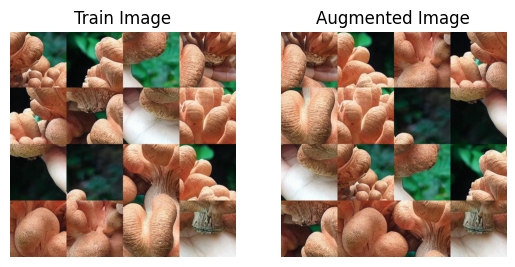


TRAIN_00001.jpg


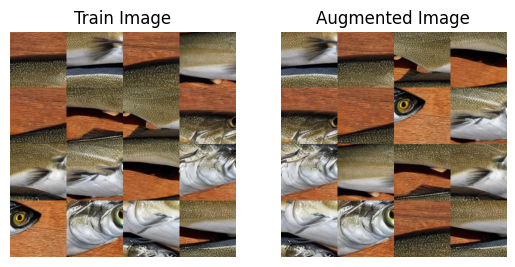


TRAIN_00002.jpg


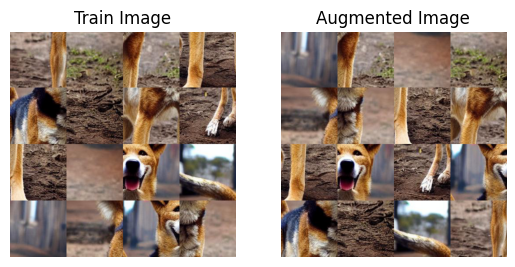


TRAIN_00003.jpg


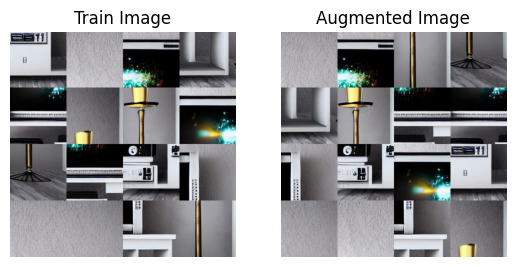


TRAIN_00004.jpg


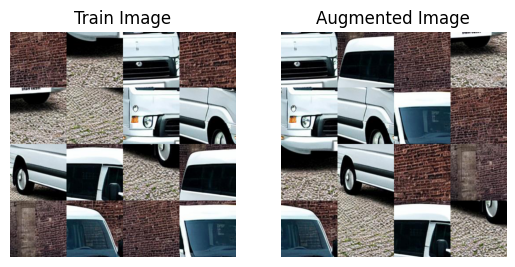


TRAIN_00005.jpg


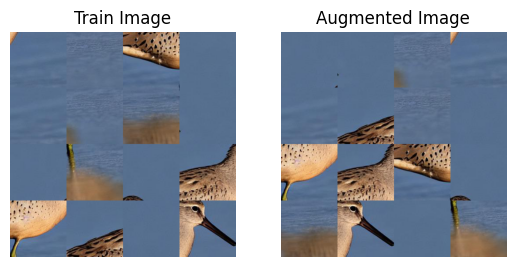


TRAIN_00006.jpg


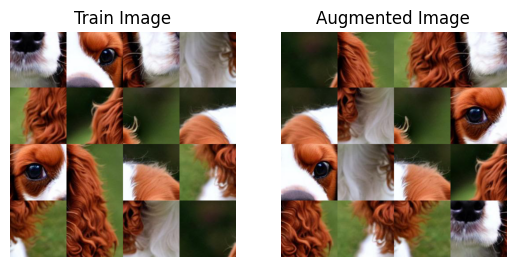


TRAIN_00007.jpg


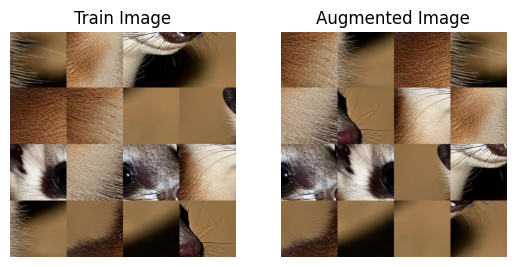


TRAIN_00008.jpg


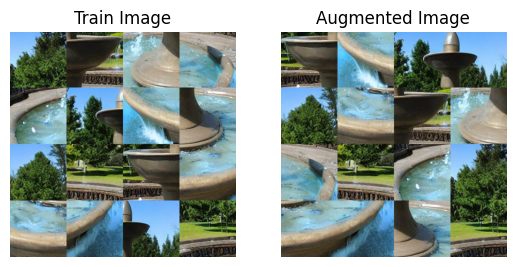


TRAIN_00009.jpg


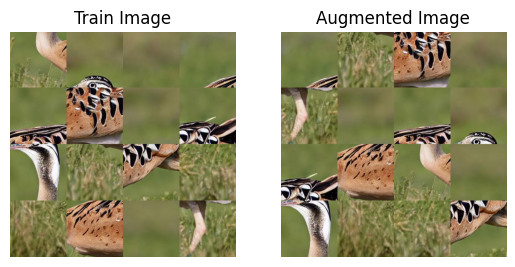


TRAIN_00010.jpg


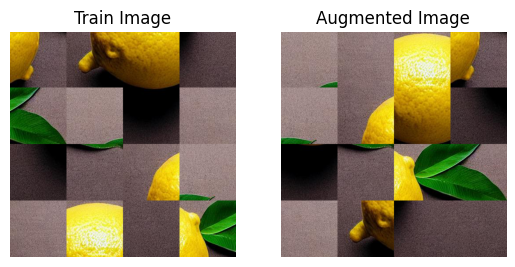


TRAIN_00011.jpg


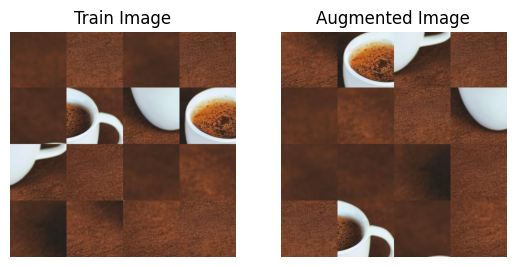


TRAIN_00012.jpg


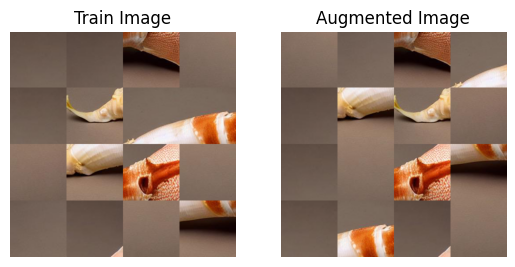


TRAIN_00013.jpg


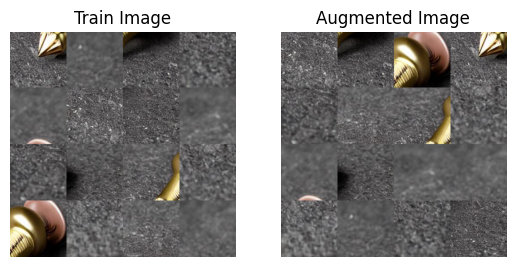


TRAIN_00014.jpg


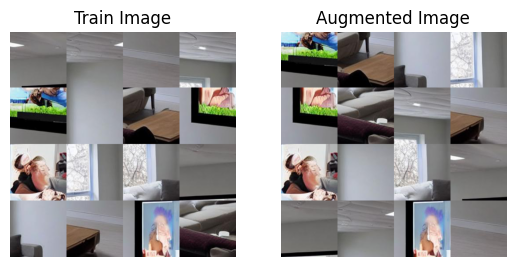

In [18]:
aug_img_save(train_df, 15, save_aug=False)

# 문제 해결 능력

`-` 직소퍼즐을 풀기위해 

In [10]:
import timm
from timm.data import create_transform
from timm.data.constants import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD

In [11]:
def calc_puzzle(answer_df, submission_df):
    # Check for missing values in submission_df
    if submission_df.isnull().values.any():
        raise ValueError("The submission dataframe contains missing values.")

    # Public or Private answer Sample and Sorting by 'ID'
    submission_df = submission_df[submission_df.iloc[:, 0].isin(answer_df.iloc[:, 0])]
    submission_df = submission_df.sort_values(by='ID').reset_index(drop=True)

    # Check for length in submission_df
    if len(submission_df) != len(answer_df):
        raise ValueError("The submission dataframe wrong length.")

    # Convert position data to numpy arrays for efficiency
    answer_positions = answer_df.iloc[:, 2:].to_numpy()  # Excluding ID, img_path, and type columns
    submission_positions = submission_df.iloc[:, 1:].to_numpy()  # Excluding ID column

    # Initialize the dictionary to hold accuracies
    accuracies = {}

    # Define combinations for 2x2 and 3x3 puzzles
    combinations_2x2 = [(i, j) for i in range(3) for j in range(2)]
    combinations_3x3 = [(i, j) for i in range(2) for j in range(3)]

    # 1x1 Puzzle Accuracy
    accuracies['1x1'] = np.mean(answer_positions == submission_positions)

    # Calculate accuracies for 2x2, 3x3, and 4x4 puzzles
    for size in range(2, 5):  # Loop through sizes 2, 3, 4
        correct_count = 0  # Initialize counter for correct full sub-puzzles
        total_subpuzzles = 0

        # Iterate through each sample's puzzle
        for i in range(len(answer_df)):
            puzzle_a = answer_positions[i].reshape(4, 4)
            puzzle_s = submission_positions[i].reshape(4, 4)
            combinations = combinations_2x2 if size == 2 else combinations_3x3 if size == 3 else [(0, 0)]

            # Calculate the number of correct sub-puzzles for this size within a 4x4
            for start_row, start_col in combinations:
                rows = slice(start_row, start_row + size)
                cols = slice(start_col, start_col + size)
                if np.array_equal(puzzle_a[rows, cols], puzzle_s[rows, cols]):
                    correct_count += 1
                total_subpuzzles += 1

        accuracies[f'{size}x{size}'] = correct_count / total_subpuzzles

    score = (accuracies['1x1'] + accuracies['2x2'] + accuracies['3x3'] + accuracies['4x4']) / 4.
    return score

In [12]:
class Model(nn.Module):
    def __init__(self, mask_ratio = 0.0, pretrained = True):
        super().__init__()

        self.mask_ratio = mask_ratio
        self.pretrained = pretrained

        deit3 = timm.create_model('deit3_base_patch16_384', pretrained = pretrained)

        self.patch_embed = deit3.patch_embed
        self.cls_token = deit3.cls_token
        self.blocks = deit3.blocks
        self.norm = deit3.norm

        self.jigsaw = nn.Sequential(
            nn.Linear(768, 768),
            nn.ReLU(),
            nn.Linear(768, 768),
            nn.ReLU(),
            nn.Linear(768, 24*24)
        )

    def random_masking(self, x, mask_ratio):
        """
        Perform per-sample random masking by per-sample shuffling.
        Per-sample shuffling is done by argsort random noise.
        x: [N, L, D], sequence
        """
        N, L, D = x.shape  # batch, length, dim
        len_keep = int(L * (1 - mask_ratio))

        noise = torch.rand(N, L, device=x.device)  # noise in [0, 1]

        # sort noise for each sample
        ids_shuffle = torch.argsort(noise, dim=1)  # ascend: small is keep, large is remove
        # target = einops.repeat(self.target, 'L -> N L', N=N)
        # target = target.to(x.device)

        # keep the first subset
        ids_keep = ids_shuffle[:, :len_keep] # N, len_keep
        x_masked = torch.gather(x, dim=1, index=ids_keep.unsqueeze(-1).repeat(1, 1, D))
        target_masked = ids_keep

        return x_masked, target_masked

    def forward(self, x):
        x = self.patch_embed(x)
        x, target = self.random_masking(x, self.mask_ratio)

        # append cls token
        cls_tokens = self.cls_token.expand(x.shape[0], -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)

        # apply Transformer blocks 
        x = self.blocks(x)
        x = self.norm(x)
        x = self.jigsaw(x[:, 1:])
        return x.reshape(-1, 24*24), target.reshape(-1)

    def forward_test(self, x):
        x = self.patch_embed(x)

        # append cls token
        cls_tokens = self.cls_token.expand(x.shape[0], -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)

        # apply Transformer blocks
        x = self.blocks(x)
        x = self.norm(x)
        x = self.jigsaw(x[:, 1:])
        return x

In [13]:
class JigsawDataset(Dataset):
    def __init__(self, df, data_path, mode='train', transform=None):
        self.df = df
        self.data_path = data_path
        self.mode = mode
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if self.mode == 'train':
            row = self.df.iloc[idx]
            image = read_image(os.path.join(self.data_path, row['img_path']))
            shuffle_order = row[[str(i) for i in range(1, 17)]].values-1 #이미지 순서 어레이로 변환, 0~15 총 16개로 저장.
            image = self.reset_image(image, shuffle_order) 
            image = Image.fromarray(image) #넘파이 array 로 image 를 생
            if self.transform:
                image = self.transform(image)
            return image
        elif self.mode == 'test':
            row = self.df.iloc[idx]
            image = Image.open(os.path.join(self.data_path, row['img_path']))
            if self.transform:
                image = self.transform(image)
            return image

    def reset_image(self, image, shuffle_order):
        c, h, w = image.shape
        block_h, block_w = h//4, w//4
        image_src = [[0 for _ in range(4)] for _ in range(4)]
        for idx, order in enumerate(shuffle_order):
            h_idx, w_idx = divmod(order,4)
            h_idx_shuffle, w_idx_shuffle = divmod(idx, 4)
            image_src[h_idx][w_idx] = image[:, block_h * h_idx_shuffle : block_h * (h_idx_shuffle+1), block_w * w_idx_shuffle : block_w * (w_idx_shuffle+1)]
        image_src = np.concatenate([np.concatenate(image_row, -1) for image_row in image_src], -2) # 재배열된 이미지 블록들을 연결하여 새로운 이미지를 생성
        return image_src.transpose(1, 2, 0) #채널을 마지막으로 이동시켜 이미지를 최종적으로 반환

In [14]:
def build_transform(is_train):
    if is_train:
        # this should always dispatch to transforms_imagenet_train
        transform = create_transform(
            input_size = (384, 384),
            is_training = True,
            color_jitter = 0.3,
            auto_augment = 'rand-m9-mstd0.5-inc1',
            interpolation= 'bicubic',
            re_prob= 0.25,
            re_mode= 'pixel',
            re_count= 1,
        )
        return transform
        # is_train =True 일 경우 , transform 을 진행.
    # create_transform 은 from timm import create_transform 이다.

    t = []
    t.append(transforms.Resize((384,384), interpolation=3))
    t.append(transforms.ToTensor())
    t.append(transforms.Normalize(IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD))
    return transforms.Compose(t)

In [15]:
df1 = pd.read_csv('DATA/test.csv')


In [16]:
df1

,ID,img_path
0,TEST_00000,./test/TEST_00000.jpg
1,TEST_00001,./test/TEST_00001.jpg
2,TEST_00002,./test/TEST_00002.jpg
3,TEST_00003,./test/TEST_00003.jpg
4,TEST_00004,./test/TEST_00004.jpg
...,...,...
59956,TEST_59956,./test/TEST_59956.jpg
59957,TEST_59957,./test/TEST_59957.jpg
59958,TEST_59958,./test/TEST_59958.jpg
59959,TEST_59959,./test/TEST_59959.jpg


In [33]:
df1

,ID,img_path,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,TEST_00000,./test/TEST_00000.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,TEST_00001,./test/TEST_00001.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,TEST_00002,./test/TEST_00002.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,TEST_00003,./test/TEST_00003.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,TEST_00004,./test/TEST_00004.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59956,TEST_59956,./test/TEST_59956.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
59957,TEST_59957,./test/TEST_59957.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
59958,TEST_59958,./test/TEST_59958.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
59959,TEST_59959,./test/TEST_59959.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [17]:
df = pd.read_csv('DATA/train.csv')
train_df = df.iloc[:-6000]
valid_df = df.iloc[-6000:]

train_transform = build_transform(is_train = True)
valid_transform = build_transform(is_train = False)

train_dataset = JigsawDataset(df = train_df,
                              data_path = './DATA',
                              mode = 'train',
                              transform = train_transform)
valid_dataset = JigsawDataset(df = valid_df,
                              data_path = './DATA',
                              mode = 'test',
                              transform = valid_transform)

train_dataloader = DataLoader(
    train_dataset,
    batch_size = 16,
    shuffle = True
)
valid_dataloader = DataLoader(
    valid_dataset,
    batch_size = 16,
    shuffle = False
)

In [18]:
df1 = pd.read_csv('DATA/test.csv')
df1[['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16']] = 0
test_transform = build_transform(is_train = False)
test_dataset = JigsawDataset(df = df1,
                              data_path = './DATA',
                              mode = 'test',
                              transform = test_transform)
test_dataloader = DataLoader(
    test_dataset,
    batch_size = 16,
    shuffle = False
)

In [19]:
df1

,ID,img_path,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,TEST_00000,./test/TEST_00000.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,TEST_00001,./test/TEST_00001.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,TEST_00002,./test/TEST_00002.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,TEST_00003,./test/TEST_00003.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,TEST_00004,./test/TEST_00004.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59956,TEST_59956,./test/TEST_59956.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
59957,TEST_59957,./test/TEST_59957.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
59958,TEST_59958,./test/TEST_59958.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
59959,TEST_59959,./test/TEST_59959.jpg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [39]:
model = Model(mask_ratio = 0.5)
model.to(device)
optimizer = optim.AdamW(model.parameters(),
                        lr=3e-5,
                        weight_decay = 0.05) #가중치 감쇠로 L2 정규 이용

In [20]:
import time
from torchvision.io import read_image

In [41]:
device = 'cuda'
for epoch in range(1, 8):
    print('Epoch ', epoch)
    st = time.time()
    model.train()
    for i, x in enumerate(train_dataloader):
        x = x.to(device) #각 반복의 dataloader 로 미니배치에 해당하는 텐서가 있다. 

        optimizer.zero_grad() # 이전값에 영향 x

        preds, targets = model(x)

        loss = F.cross_entropy(preds, targets)

        loss.backward()
        optimizer.step()

        if i % 100 == 0:
            print(f'[{i} / {len(train_dataloader)}] loss:', loss.item())
    et = time.time()
    print('Time elapsed: ', et-st)

Epoch  1
[0 / 4000] loss: 6.370084762573242
[100 / 4000] loss: 6.3453755378723145
[200 / 4000] loss: 6.305933475494385
[300 / 4000] loss: 6.288524150848389
[400 / 4000] loss: 6.246350288391113
[500 / 4000] loss: 6.206143379211426
[600 / 4000] loss: 6.18327522277832
[700 / 4000] loss: 6.182096481323242
[800 / 4000] loss: 6.293306350708008
[900 / 4000] loss: 6.147626876831055
[1000 / 4000] loss: 6.020139694213867
[1100 / 4000] loss: 6.126694202423096
[1200 / 4000] loss: 5.972053527832031
[1300 / 4000] loss: 6.109827041625977
[1400 / 4000] loss: 6.072889804840088
[1500 / 4000] loss: 6.053614139556885
[1600 / 4000] loss: 5.9451446533203125
[1700 / 4000] loss: 6.027298450469971
[1800 / 4000] loss: 5.949366092681885
[1900 / 4000] loss: 5.9035210609436035
[2000 / 4000] loss: 5.906427383422852
[2100 / 4000] loss: 5.946854114532471
[2200 / 4000] loss: 5.772212028503418
[2300 / 4000] loss: 5.941822052001953
[2400 / 4000] loss: 5.764211177825928
[2500 / 4000] loss: 5.720510482788086
[2600 / 4000]

In [42]:
# 모델을 저장할 파일 경로 지정
save_path = 'ViTmodel.pth'

# 모델의 상태 및 다른 필요한 정보 저장
model_state = model.state_dict()
optimizer_state = optimizer.state_dict()
epoch = 7  # 현재 epoch 번호 등 필요한 추가 정보

# 저장할 정보를 딕셔너리로 정리
checkpoint = {
    'epoch': epoch,
    'model_state_dict': model_state,
    'optimizer_state_dict': optimizer_state,
}

# torch.save를 사용하여 모델 저장
torch.save(checkpoint, save_path)


In [21]:
# 모델을 불러올 파일 경로 지정
load_path = 'ViTmodel.pth'

# 저장된 정보를 불러오기
checkpoint = torch.load(load_path)

# 모델 생성 (이전과 동일한 구조여야 함)
loaded_model = Model(mask_ratio=0.5)

# 불러온 상태를 모델에 적용
loaded_model.load_state_dict(checkpoint['model_state_dict'])

# 옵티마이저 생성 (이전과 동일한 구조여야 함)
loaded_optimizer = optim.AdamW(loaded_model.parameters(), lr=3e-5, weight_decay=0.05)

# 불러온 옵티마이저의 상태를 적용
loaded_optimizer.load_state_dict(checkpoint['optimizer_state_dict'])


In [28]:
outs = []
model.eval()
with torch.no_grad():
    for x in tqdm(valid_dataloader):
        x = x.to('cuda')
        out = model.forward_test(x)
        out = out.argmax(dim=2).cpu().numpy()
        outs.append(out)

outs = np.vstack(outs)
valid_pred_df = valid_df.copy().drop(columns=['img_path'])

for I, (idx, row) in enumerate(tqdm(valid_pred_df.iterrows(), total=len(valid_df))):
    w = outs[I].reshape(24,24)
    CNT_ROW = np.zeros((4,4,4), dtype=np.int32)
    CNT_COL = np.zeros((4,4,4), dtype=np.int32)
    for i in range(24):
        for j in range(24):
            ROW = i // 6
            COL = j // 6
            v = w[i][j]
            CNT_ROW[ROW][COL][v // 24 // 6] += 1
            CNT_COL[ROW][COL][v % 24 // 6] += 1
    ans = CNT_ROW.argmax(2) * 4 + CNT_COL.argmax(2) + 1
    ans = ans.reshape(16)
    ans = list(map(str, ans))
    valid_pred_df.loc[idx, '1':'16'] = ans
score = calc_puzzle(valid_df, valid_pred_df)
print(score)

  0%|          | 0/375 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

0.0


In [30]:
valid_pred_df

,ID,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
64000,TRAIN_64000,11,2,1,15,11,15,16,15,8,6,6,11,2,12,2,7
64001,TRAIN_64001,11,13,8,9,3,12,3,14,7,10,5,6,4,4,3,3
64002,TRAIN_64002,7,15,3,3,6,14,12,4,12,3,10,13,8,16,13,7
64003,TRAIN_64003,3,8,9,2,1,14,6,10,12,4,1,5,15,4,12,16
64004,TRAIN_64004,16,5,2,9,13,8,16,2,1,10,7,6,12,14,11,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,TRAIN_69995,8,3,8,1,2,3,15,10,10,14,13,6,12,16,9,15
69996,TRAIN_69996,11,9,2,10,4,12,2,6,15,8,9,13,15,6,16,2
69997,TRAIN_69997,12,1,14,13,5,7,2,3,12,6,7,15,1,11,5,4
69998,TRAIN_69998,8,15,4,3,3,13,14,7,6,9,1,11,13,2,13,10


In [28]:
outs1 = []
loaded_model.eval()
loaded_model.to('cuda')
with torch.no_grad():
    for x in tqdm(test_dataloader):
        x = x.to('cuda')
        out1 = loaded_model.forward_test(x)
        out1 = out1.argmax(dim=2).cpu().numpy()
        outs1.append(out1)

outs1 = np.vstack(outs1)
test_pred_df = df1.copy().drop(columns=['img_path'])


  0%|          | 0/3748 [00:00<?, ?it/s]

In [29]:

for I, (idx, row) in enumerate(tqdm(test_pred_df.iterrows(), total=len(df1))):
    w = outs1[I].reshape(24,24)
    CNT_ROW = np.zeros((4,4,4), dtype=np.int32)
    CNT_COL = np.zeros((4,4,4), dtype=np.int32)
    for i in range(24):
        for j in range(24):
            ROW = i // 6
            COL = j // 6
            v = w[i][j]
            CNT_ROW[ROW][COL][v // 24 // 6] += 1
            CNT_COL[ROW][COL][v % 24 // 6] += 1
    ans = CNT_ROW.argmax(2) * 4 + CNT_COL.argmax(2) + 1
    ans = ans.reshape(16)
    ans = list(map(str, ans))
    test_pred_df.loc[idx, '1':'16'] = ans

print(score)

  0%|          | 0/59961 [00:00<?, ?it/s]

NameError: name 'score' is not defined

In [30]:
score = calc_puzzle(df1, test_pred_df)

In [31]:
print(score)

0.0


In [32]:
test_pred_df.to_csv('clearsubmission.csv', index=False)

In [33]:
test_pred_df

,ID,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,TEST_00000,12,9,7,12,16,2,13,12,8,4,7,13,1,8,1,13
1,TEST_00001,13,8,13,10,13,1,8,10,4,16,5,9,12,2,2,9
2,TEST_00002,7,4,16,16,6,14,11,15,5,3,4,1,10,9,10,8
3,TEST_00003,5,12,11,13,15,3,9,6,1,16,16,9,3,7,7,1
4,TEST_00004,2,5,7,10,1,14,3,16,9,6,7,13,11,4,16,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59956,TEST_59956,4,16,15,8,4,16,5,13,4,4,13,13,13,8,16,16
59957,TEST_59957,9,8,3,8,5,8,16,12,12,12,8,2,2,14,9,13
59958,TEST_59958,9,6,16,16,12,13,6,2,10,4,2,11,7,2,16,16
59959,TEST_59959,1,5,9,14,13,5,10,12,12,2,16,3,14,3,8,8
